<a href="https://colab.research.google.com/github/Mishabz4321/DEEP-LEARNING/blob/main/ANIMAL_DETECTION_BY_TRANSFER_LEARNING_DenseNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# to prevent unnecessary warnings 
import warnings 
warnings.simplefilter(action='ignore', category=FutureWarning)  
# TensorFlow and tf.keras
import tensorflow as tf 
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout,Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy, BinaryCrossentropy
from tensorflow.keras.callbacks import TensorBoard,EarlyStopping
%load_ext tensorboard 
 # Helper libraries 
import numpy as np 
import matplotlib.pyplot as plt
import os 
import subprocess 
import cv2 
import json 
import requests 
import pandas as pd
from tqdm import tqdm 
import datetime
print(tf.__version__)

2.5.0


In [ ]:
!git clone 'https://github.com/dphi-official/Datasets/'

Cloning into 'Datasets'...
remote: Enumerating objects: 10226, done.
remote: Counting objects: 100% (79/79), done.
remote: Compressing objects: 100% (68/68), done.
remote: Total 10226 (delta 22), reused 62 (delta 11), pack-reused 10147
Receiving objects: 100% (10226/10226), 556.73 MiB | 31.28 MiB/s, done.
Resolving deltas: 100% (212/212), done.
Checking out files: 100% (9435/9435), done.


In [ ]:
# To unzip train_beg.zip
!unzip /content/Datasets/animal_data/train_beg.zip 

# To unzip test_beg.zip
!unzip /content/Datasets/animal_data/test_beg.zip

Archive:  /content/Datasets/animal_data/train_beg.zip
   creating: train_beg/
  inflating: train_beg/Image_1.jpg   
  inflating: train_beg/Image_10.jpg  
  inflating: train_beg/Image_100.jpg  
  inflating: train_beg/Image_1000.jpg  
  inflating: train_beg/Image_1001.jpg  
  inflating: train_beg/Image_1002.jpg  
  inflating: train_beg/Image_1003.jpg  
  inflating: train_beg/Image_1004.jpg  
  inflating: train_beg/Image_1005.jpg  
  inflating: train_beg/Image_1006.jpg  
  inflating: train_beg/Image_1007.jpg  
  inflating: train_beg/Image_1008.jpg  
  inflating: train_beg/Image_1009.jpg  
  inflating: train_beg/Image_101.jpg  
  inflating: train_beg/Image_1010.jpg  
  inflating: train_beg/Image_1011.jpg  
  inflating: train_beg/Image_1012.jpg  
  inflating: train_beg/Image_1013.jpg  
  inflating: train_beg/Image_1014.jpg  
  inflating: train_beg/Image_1015.jpg  
  inflating: train_beg/Image_1016.jpg  
  inflating: train_beg/Image_1017.jpg  
  inflating: train_beg/Image_1018.jpg  
  inflat

In [ ]:
# Loading training csv file
train_labels = pd.read_csv("/content/Datasets/animal_data/Training_set_animals.csv")
train_labels.head()    # display first five rows from train_labels dataframe

,filename,animal_type
0,Image_1.jpg,mucca
1,Image_2.jpg,mucca
2,Image_3.jpg,mucca
3,Image_4.jpg,mucca
4,Image_5.jpg,mucca


In [ ]:
image_paths = ['/content/train_beg/' + fname for fname in train_labels['filename']]
image_paths    # will get list of list of image id and image path

['/content/train_beg/Image_1.jpg',
 '/content/train_beg/Image_2.jpg',
 '/content/train_beg/Image_3.jpg',
 '/content/train_beg/Image_4.jpg',
 '/content/train_beg/Image_5.jpg',
 '/content/train_beg/Image_6.jpg',
 '/content/train_beg/Image_7.jpg',
 '/content/train_beg/Image_8.jpg',
 '/content/train_beg/Image_9.jpg',
 '/content/train_beg/Image_10.jpg',
 '/content/train_beg/Image_11.jpg',
 '/content/train_beg/Image_12.jpg',
 '/content/train_beg/Image_13.jpg',
 '/content/train_beg/Image_14.jpg',
 '/content/train_beg/Image_15.jpg',
 '/content/train_beg/Image_16.jpg',
 '/content/train_beg/Image_17.jpg',
 '/content/train_beg/Image_18.jpg',
 '/content/train_beg/Image_19.jpg',
 '/content/train_beg/Image_20.jpg',
 '/content/train_beg/Image_21.jpg',
 '/content/train_beg/Image_22.jpg',
 '/content/train_beg/Image_23.jpg',
 '/content/train_beg/Image_24.jpg',
 '/content/train_beg/Image_25.jpg',
 '/content/train_beg/Image_26.jpg',
 '/content/train_beg/Image_27.jpg',
 '/content/train_beg/Image_28.jpg',
 

In [ ]:
# Confirm if number of filepaths (i.e. images) is same as number of labels given
if len(train_labels) == len(image_paths):
    print('Number of labels i.e. ', len(train_labels), 'matches the number of filepaths i.e. ', len(image_paths))
else:
    print('Number of labels does not match the number of filepaths')

Number of labels i.e.  1200 matches the number of filepaths i.e.  1200


In [ ]:
train_data_df = pd.DataFrame({'filename': train_labels['filename'], 'filepath': image_paths, 'animal_type': train_labels['animal_type']})
train_data_df.head()

,filename,filepath,animal_type
0,Image_1.jpg,/content/train_beg/Image_1.jpg,mucca
1,Image_2.jpg,/content/train_beg/Image_2.jpg,mucca
2,Image_3.jpg,/content/train_beg/Image_3.jpg,mucca
3,Image_4.jpg,/content/train_beg/Image_4.jpg,mucca
4,Image_5.jpg,/content/train_beg/Image_5.jpg,mucca


In [ ]:
len(train_data_df)

1200

In [ ]:
X = []    # initialize a list to store, each image's pixel values 
y = []   # initialize a list to store each image's labels i.e. animal type
for i in range(len(train_data_df)):
  image_arr = cv2.imread(str(train_data_df['filepath'][i]))
  resized_img= cv2.resize(image_arr, (224,224), interpolation=cv2.INTER_CUBIC)    # for each i starting from 0, convert the ith image to array of pixels
  X.append(resized_img)
  # We also need to convert the categorical values i.e. 'mucca' and 'pecora' to numerical
  # Using conditional statement, we can do it here only. if mucca then 0, if pecora then 1
  if train_data_df['animal_type'][i] == 'mucca':           # if respective image's label is mucca
    y.append(0)
  else:               # since there are only two type of animals, if the animal is not mucca, it will be pecora
    y.append(1)      # This indexing needs to be remembered 'mucca' = 0 and 'pecora' = 1, this will be required when you convert your predictions on test data to categorical value again

In [ ]:
X[0].shape

(224, 224, 3)

In [ ]:
X[:10]

[array([[[207, 205, 205],
         [207, 205, 205],
         [207, 205, 205],
         ...,
         [203, 202, 204],
         [204, 203, 205],
         [205, 204, 206]],
 
        [[205, 203, 203],
         [206, 204, 204],
         [206, 204, 204],
         ...,
         [202, 201, 203],
         [204, 203, 205],
         [206, 205, 207]],
 
        [[207, 205, 205],
         [205, 203, 203],
         [205, 203, 203],
         ...,
         [202, 201, 203],
         [205, 204, 206],
         [207, 206, 208]],
 
        ...,
 
        [[244, 251, 246],
         [239, 254, 251],
         [219, 255, 250],
         ...,
         [254, 254, 254],
         [254, 254, 254],
         [254, 254, 254]],
 
        [[241, 249, 244],
         [237, 255, 250],
         [217, 255, 249],
         ...,
         [254, 254, 254],
         [254, 254, 254],
         [254, 254, 254]],
 
        [[243, 251, 246],
         [239, 255, 252],
         [219, 255, 251],
         ...,
         [254, 254, 254],
  

In [ ]:
y[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

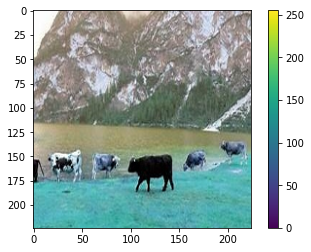

label: 0


In [ ]:
plt.figure()
plt.imshow(X[1])
plt.colorbar()
plt.grid(False)
plt.show()
print('label:', y[1])

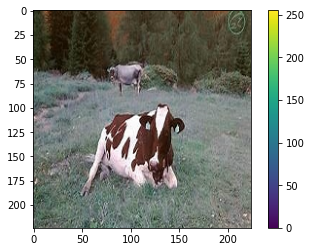

label: 0


In [ ]:
plt.figure()
plt.imshow(X[11])
plt.colorbar()
plt.grid(False)
plt.show()
print('label:', y[11])

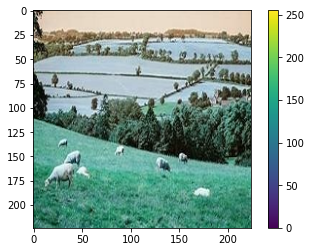

label: 1


In [ ]:
plt.figure()
plt.imshow(X[700])
plt.colorbar()
plt.grid(False)
plt.show()
print('label:', y[700])

In [ ]:
X= np.array(X)
y= np.array(y)

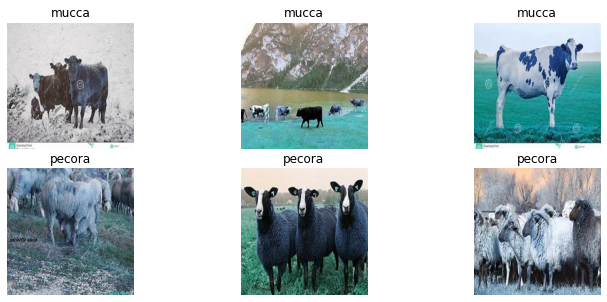

In [ ]:
num_rows, num_cols = 2,3
f, ax = plt.subplots(num_rows, num_cols, figsize=(12,5),
                     gridspec_kw={'wspace':0.15, 'hspace':0.15}, 
                     squeeze=True)

for r in range(num_rows):
    for c in range(num_cols):
      
        image_index = r*650 + c
        ax[r,c].axis("off")
        ax[r,c].imshow(X[image_index], cmap='gray')
        ax[r,c].set_title(train_data_df['animal_type'][image_index])
plt.show()
plt.close()

In [ ]:
X.shape

(1200, 224, 224, 3)

In [ ]:
# resizing images
#def resize_image_array(img, img_size_dims):
    #img = cv2.resize(img, dsize=img_size_dims, 
                   #  interpolation=cv2.INTER_CUBIC)
    #img = np.array(img, dtype=np.float32)
   # return img

In [ ]:
%%time

#IMG_DIMS = (32, 32)
#train_images_3ch = np.array([resize_image_array(img, img_size_dims=IMG_DIMS) for img in train_data])
#print('\nTrain_images.shape: {}, of {}'.format(train_images_3ch.shape, train_images_3ch.dtype))


Train_images.shape: (1200, 300, 200, 3), of float32
CPU times: user 906 ms, sys: 1.34 s, total: 2.25 s
Wall time: 2.25 s


In [ ]:
#train_images_3ch.shape

(1200, 300, 200, 3)

In [ ]:
X= X.reshape(X.shape[0], 224,224,3)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=0)

In [ ]:
print('\nTrain_images.shape: {}, of {}'.format(X_train.shape, X_train.dtype))
print('Test_images.shape: {}, of {}'.format(X_test.shape, X_test.dtype))


Train_images.shape: (960, 224, 224, 3), of uint8
Test_images.shape: (240, 224, 224, 3), of uint8


In [ ]:
X_train_scaled= X_train/255.0
X_test_scaled= X_test/255.0

In [ ]:
data_augmentation = Sequential(
  [
    keras.layers.experimental.preprocessing.RandomFlip("horizontal", 
                                                 input_shape=(180, 
                                                              180,
                                                              3)),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
  ]
)

## BUILDING CNN ARCHITECTURE

In [ ]:
# sequential model
# Clear any logs from previous runs
!rm -rf ./logs/ 
model= Sequential()
# con-pool 1
model.add(tf.keras.layers.Conv2D(filters=32, 
                                 kernel_size=(3,3), 
                                 strides=(1,1),
                                 padding='valid',
                                 activation='relu',
                                 input_shape=(180, 180, 3)
))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

# con-pool 2
model.add(tf.keras.layers.Conv2D(filters=64, 
                                 kernel_size=(3,3), 
                                 strides=(1,1),
                                 padding='valid',
                                 activation='relu',
))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

# con-pool 3
model.add(tf.keras.layers.Conv2D(filters=64, 
                                 kernel_size=(3,3), 
                                 strides=(1,1),
                                 padding='valid',
                                 activation='relu',
))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

#flatten
model.add(tf.keras.layers.Flatten())

# add dense layers with some dropout
model.add(Dense(512, activation='relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(256, activation='relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(64, activation='relu'))
model.add(Dropout(rate=0.3))
# add output layer
model.add(Dense(1, activation='sigmoid'))

# compile model
model.compile(optimizer='adam', 
              loss='binary_crossentropy', 
              metrics=['accuracy'])

# view model layers
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 178, 178, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 89, 89, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 87, 87, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 43, 43, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 41, 41, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, 
                                               restore_best_weights=True,
                                               verbose=1, mode='auto', baseline=None, min_delta=0)

model.fit(X_train_scaled, y_train,
                    batch_size=32,
                    callbacks=[es_callback, tensorboard_callback], 
                    validation_split=0.2, epochs=50,
                    verbose=1)

Epoch 1/50
24/24 [==============================] - 39s 2s/step - loss: 0.7213 - accuracy: 0.5143 - val_loss: 0.6904 - val_accuracy: 0.4740
Epoch 2/50
24/24 [==============================] - 38s 2s/step - loss: 0.6856 - accuracy: 0.5625 - val_loss: 0.6682 - val_accuracy: 0.6771
Epoch 3/50
24/24 [==============================] - 38s 2s/step - loss: 0.6410 - accuracy: 0.6419 - val_loss: 0.6400 - val_accuracy: 0.5521
Epoch 4/50
24/24 [==============================] - 38s 2s/step - loss: 0.5792 - accuracy: 0.6992 - val_loss: 0.6302 - val_accuracy: 0.6771
Epoch 5/50
24/24 [==============================] - 38s 2s/step - loss: 0.5379 - accuracy: 0.7188 - val_loss: 0.6410 - val_accuracy: 0.7031
Epoch 6/50
24/24 [==============================] - 38s 2s/step - loss: 0.4857 - accuracy: 0.7682 - val_loss: 0.6233 - val_accuracy: 0.7135
Epoch 7/50
24/24 [==============================] - 38s 2s/step - loss: 0.3478 - accuracy: 0.8411 - val_loss: 0.8570 - val_accuracy: 0.6875
Epoch 8/50
24/24 [==

In [ ]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 519), started 0:06:13 ago. (Use '!kill 519' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
test_loss, test_acc = model.evaluate(X_test_scaled,  y_test, verbose=2)

print('\nTest accuracy:', test_acc)

8/8 - 3s - loss: 0.6440 - accuracy: 0.6833

Test accuracy: 0.6833333373069763


# Customizing DenseNet169---

In [ ]:
INPUT_SHAPE= (224, 224, 3)
densenet_layers= tf.keras.applications.densenet.DenseNet169(weights='imagenet', include_top= False, input_shape=INPUT_SHAPE)
densenet_layers.summary()

51879936/51877672 [==============================] - 1s 0us/step
Model: "densenet169"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
_______________________

In [ ]:
# Fine tune all layers
for layer in densenet_layers.layers:
  layer.trainable=True
# Check the trainable status of the individual layers
for layer in densenet_layers.layers:
    print(layer, layer.trainable)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f5c36b65050> True
<tensorflow.python.keras.layers.convolutional.ZeroPadding2D object at 0x7f5c36b76f10> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f5c36b48150> True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f5c36b48cd0> True
<tensorflow.python.keras.layers.core.Activation object at 0x7f5c36b02610> True
<tensorflow.python.keras.layers.convolutional.ZeroPadding2D object at 0x7f5c36b77a90> True
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f5c202cd2d0> True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f5c202e0350> True
<tensorflow.python.keras.layers.core.Activation object at 0x7f5c202daf10> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f5c202e0b10> True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f5c202e9cd0> True
<tensorflow.python.keras.

In [ ]:
!rm -rf ./logs/
import random
import random
from tensorflow.keras.optimizers import RMSprop

random.seed(21)
print(random.random())
# define sequential model
model = tf.keras.models.Sequential()

# Add the vgg convolutional base model
model.add(densenet_layers)

# add flatten layer
model.add(tf.keras.layers.Flatten())

# add dense layers with some dropout
model.add(tf.keras.layers.Dense(1024, activation='relu'))
#model.add(tf.keras.layers.Dropout(rate=0.1))
model.add(tf.keras.layers.Dense(1024, activation='relu'))
#model.add(tf.keras.layers.Dropout(rate=0.1))


# add output layer
model.add(tf.keras.layers.Dense(2, activation='softmax'))

# compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

# view model layers
model.summary()

0.16494947983319797
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet169 (Functional)     (None, 7, 7, 1664)        12642880  
_________________________________________________________________
flatten (Flatten)            (None, 81536)             0         
_________________________________________________________________
dense (Dense)                (None, 1024)              83493888  
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              1049600   
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 2050      
Total params: 97,188,418
Trainable params: 97,030,018
Non-trainable params: 158,400
_________________________________________________________________


In [ ]:
from sklearn.model_selection import train_test_split
train_df, validate_df = train_test_split(train_data_df, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

In [ ]:
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]

## Augmenting Images with ImageDataGenerator

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
    rotation_range=15,
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.3,
    horizontal_flip=True,
    width_shift_range=0.2,
    height_shift_range=0.1
)

In [ ]:
total_validate, total_train

(240, 960)

In [ ]:
train_generator = train_datagen.flow_from_dataframe(train_df, r'/content/train_beg',
                                             x_col='filename',y_col='animal_type',class_mode='binary',
                                   batch_size=32, target_size=(224,224),shuffle=False)

Found 960 validated image filenames belonging to 2 classes.


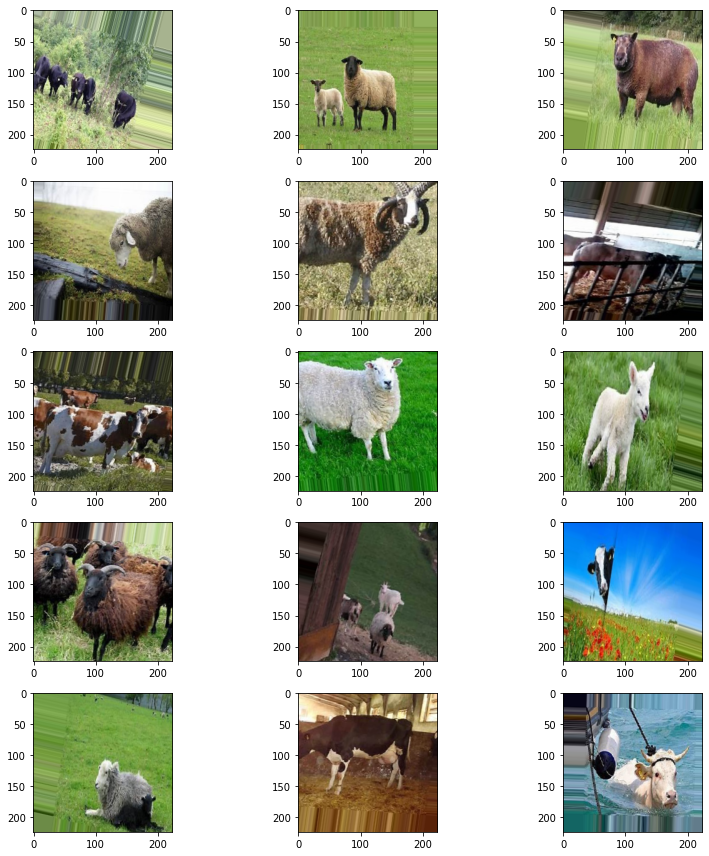

In [ ]:
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in train_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

In [ ]:
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df, 
    r'/content/train_beg',x_col='filename',y_col='animal_type',class_mode='binary',
                                   batch_size=32, target_size=(224,224),shuffle=False)

Found 240 validated image filenames belonging to 2 classes.


In [ ]:
EPOCHS = 7
batch_size=32
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2, 
                                               restore_best_weights=True,
                                               verbose=1)
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(
    train_generator, 
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=[es_callback,tensorboard_callback]
)

Epoch 1/7
30/30 [==============================] - 72s 733ms/step - loss: 0.3831 - accuracy: 0.8417 - val_loss: 0.1252 - val_accuracy: 0.9554
Epoch 2/7
30/30 [==============================] - 18s 597ms/step - loss: 0.1612 - accuracy: 0.9354 - val_loss: 0.1351 - val_accuracy: 0.9420
Epoch 3/7
30/30 [==============================] - 17s 562ms/step - loss: 0.0581 - accuracy: 0.9802 - val_loss: 0.1468 - val_accuracy: 0.9464
Restoring model weights from the end of the best epoch.
Epoch 00003: early stopping


In [ ]:
# saving the model
save_dir = "/content/drive/MyDrive/Colab Notebooks/Deep Learning"
model_name = 'mymodel_DenseNet.h5'
model.save(model_name)
model_path = save_dir + model_name
print(model_path)

/content/drive/MyDrive/Colab Notebooks/Deep Learningmymodel_DenseNet.h5


In [ ]:
# Get the csv file given 'Testing_set_animals.csv'
test_image_ids = pd.read_csv("/content/Datasets/animal_data/Testing_set_animals.csv", names = ['filename'])  # there is no header in the csv file so we need to provide it. You can also do header = None
test_image_ids.head()

,filename
0,Image_1.jpg
1,Image_2.jpg
2,Image_3.jpg
3,Image_4.jpg
4,Image_5.jpg


In [ ]:
image_paths_test = ['/content/test_beg/' + fname for fname in test_image_ids['filename']]
image_paths_test

['/content/test_beg/Image_1.jpg',
 '/content/test_beg/Image_2.jpg',
 '/content/test_beg/Image_3.jpg',
 '/content/test_beg/Image_4.jpg',
 '/content/test_beg/Image_5.jpg',
 '/content/test_beg/Image_6.jpg',
 '/content/test_beg/Image_7.jpg',
 '/content/test_beg/Image_8.jpg',
 '/content/test_beg/Image_9.jpg',
 '/content/test_beg/Image_10.jpg',
 '/content/test_beg/Image_11.jpg',
 '/content/test_beg/Image_12.jpg',
 '/content/test_beg/Image_13.jpg',
 '/content/test_beg/Image_14.jpg',
 '/content/test_beg/Image_15.jpg',
 '/content/test_beg/Image_16.jpg',
 '/content/test_beg/Image_17.jpg',
 '/content/test_beg/Image_18.jpg',
 '/content/test_beg/Image_19.jpg',
 '/content/test_beg/Image_20.jpg',
 '/content/test_beg/Image_21.jpg',
 '/content/test_beg/Image_22.jpg',
 '/content/test_beg/Image_23.jpg',
 '/content/test_beg/Image_24.jpg',
 '/content/test_beg/Image_25.jpg',
 '/content/test_beg/Image_26.jpg',
 '/content/test_beg/Image_27.jpg',
 '/content/test_beg/Image_28.jpg',
 '/content/test_beg/Image_29.

In [ ]:
# Confirm if number of filepaths (i.e. images) is same as number of labels given
if len(test_image_ids) == len(image_paths):
    print('Number of labels i.e. ', len(test_image_ids), 'matches the number of filepaths i.e. ', len(image_paths))
else:
    print('Number of labels does not match the number of filepaths')

Number of labels i.e.  400 matches the number of filepaths i.e.  400


In [ ]:
test_data_df = pd.DataFrame({'filename': test_image_ids['filename'], 'filepath': image_paths_test})
test_data_df.head()

,filename,filepath
0,Image_1.jpg,/content/test_beg/Image_1.jpg
1,Image_2.jpg,/content/test_beg/Image_2.jpg
2,Image_3.jpg,/content/test_beg/Image_3.jpg
3,Image_4.jpg,/content/test_beg/Image_4.jpg
4,Image_5.jpg,/content/test_beg/Image_5.jpg


In [ ]:
# Load image pixels using cv2
image_pixels = []
for i in range(len(test_data_df)):
  img_array = cv2.imread(test_data_df['filepath'][i])
  img_array= cv2.resize(img_array, (224,224), interpolation=cv2.INTER_CUBIC)
  image_pixels.append(img_array)

In [ ]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(
    test_data_df, 
    r'/content/test_beg', 
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=(224,224),
    batch_size=batch_size,
    shuffle=False
)

Found 400 validated image filenames.


In [ ]:
y_predict=model.predict(test_generator)

In [ ]:
final=[]
for i in range(0,len(test_data_df)):
    final.append(np.argmax(y_predict[i]))

In [ ]:
g=pd.DataFrame(final)
g['label']=g[0].replace({1.0:'pecora',0.0:'mucca'})
g= g.drop(0, axis=1)

In [ ]:
final_df_test= pd.concat([test_data_df, g], axis=1)

In [ ]:
final_df_test.head()

,filename,filepath,label
0,Image_1.jpg,/content/test_beg/Image_1.jpg,pecora
1,Image_2.jpg,/content/test_beg/Image_2.jpg,pecora
2,Image_3.jpg,/content/test_beg/Image_3.jpg,mucca
3,Image_4.jpg,/content/test_beg/Image_4.jpg,pecora
4,Image_5.jpg,/content/test_beg/Image_5.jpg,pecora


In [ ]:
res = test_data_df
res.to_csv("highestlatest.csv")